In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/state-farm-distracted-driver-detection/sample_submission.csv
/kaggle/input/state-farm-distracted-driver-detection/driver_imgs_list.csv
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_96590.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_32366.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_99675.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_85937.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_73903.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_89410.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_70462.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_45622.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_55507.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_34204.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_16279.jpg
/kag

In [2]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import random
import pandas as pd
import seaborn as sns
from PIL import Image
import glob
import pickle
import datetime


2025-05-23 18:02:46.005570: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-23 18:02:46.005685: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-23 18:02:46.127150: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


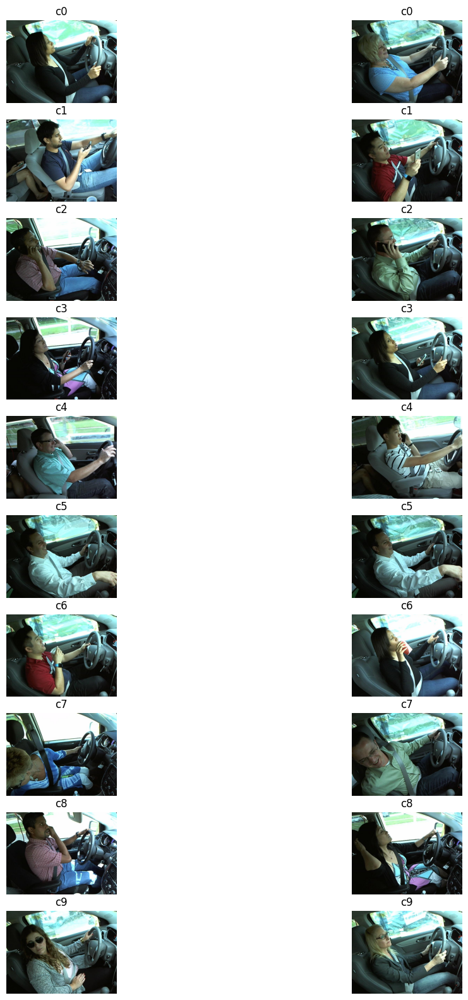

In [3]:
dataset_path = "/kaggle/input/state-farm-distracted-driver-detection/imgs"
TRAIN_DIR = os.path.join(dataset_path, "train")

# Define labels and corresponding classes
labels = {'c0': 'Safe driving',
          'c1': 'Texting - right',
          'c2': 'Talking on the phone - right',
          'c3': 'Texting - left',
          'c4': 'Talking on the phone - left',
          'c5': 'Operating the radio',
          'c6': 'Drinking',
          'c7': 'Reaching behind',
          'c8': 'Hair and makeup',
          'c9': 'Talking to passenger'}
# randomly selecting two images per class
imgs = {}
for label in labels:
    try:
        img_paths = [os.path.join(TRAIN_DIR, label, img_name) for img_name in random.sample(os.listdir(os.path.join(TRAIN_DIR, label)), 2)]
        imgs[label] = [cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB) for img_path in img_paths]
    except FileNotFoundError:
        print(f"Directory not found for label: {label}")

# Display the images
display_rows = 10
display_columns = 3
fig = plt.figure(figsize=(20, 20))

for label, index in zip(labels, range(15)):
    for i, img in enumerate(imgs.get(label, [])[:3]):
        fig.add_subplot(display_rows, display_columns, index * 3 + i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(label)

In [4]:
 IMG_SIZE = (64 ,64) # ensures resizing each input image to 64x64 pixels
BATCH_SIZE = 40 

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_gen = ImageDataGenerator(
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.4,
    validation_split=0.2,
)

In [6]:
train_data = train_gen.flow_from_directory("/kaggle/input/state-farm-distracted-driver-detection/imgs/train",
                                           target_size=IMG_SIZE,
                                           batch_size=BATCH_SIZE,
                                           subset='training',
                                           seed=42)

Found 17943 images belonging to 10 classes.


In [7]:
val_data = train_gen.flow_from_directory("/kaggle/input/state-farm-distracted-driver-detection/imgs/train",
                                         target_size=IMG_SIZE,
                                         batch_size=BATCH_SIZE,
                                         subset='validation',
                                         seed = 42)

Found 4481 images belonging to 10 classes.


In [9]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout, LeakyReLU
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2

def create_model(img_rows, img_cols, color_type=3, num_classes=10):
    # Define the input layer
    input_layer = Input(shape=(img_rows, img_cols, color_type))

    # CNN layers
    conv1 = Conv2D(32, (3, 3), padding='same', kernel_regularizer=l2(0.001))(input_layer)
    leaky1 = LeakyReLU()(conv1)
    batch1 = BatchNormalization()(leaky1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(batch1)
    drop1 = Dropout(0.3)(pool1)

    conv2 = Conv2D(64, (3, 3), padding='same', kernel_regularizer=l2(0.001))(drop1)
    leaky2 = LeakyReLU()(conv2)
    batch2 = BatchNormalization()(leaky2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(batch2)
    drop2 = Dropout(0.3)(pool2)

    conv3 = Conv2D(128, (3, 3), padding='same', kernel_regularizer=l2(0.001))(drop2)
    leaky3 = LeakyReLU()(conv3)
    batch3 = BatchNormalization()(leaky3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(batch3)
    drop3 = Dropout(0.3)(pool3)

    conv4 = Conv2D(256, (3, 3), padding='same', kernel_regularizer=l2(0.001))(drop3)
    leaky4 = LeakyReLU()(conv4)
    batch4 = BatchNormalization()(leaky4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(batch4)
    drop4 = Dropout(0.3)(pool4)

    # Global Average Pooling
    global_pool = GlobalAveragePooling2D()(drop4)

    # Dense layers
    dense1 = Dense(512, kernel_regularizer=l2(0.001))(global_pool)
    leaky5 = LeakyReLU()(dense1)
    batch5 = BatchNormalization()(leaky5)
    drop5 = Dropout(0.5)(batch5)

    dense2 = Dense(256, kernel_regularizer=l2(0.001))(drop5)
    leaky6 = LeakyReLU()(dense2)
    batch6 = BatchNormalization()(leaky6)
    drop6 = Dropout(0.5)(batch6)

    dense3 = Dense(128, kernel_regularizer=l2(0.001))(drop6)
    leaky7 = LeakyReLU()(dense3)
    batch7 = BatchNormalization()(leaky7)
    drop7 = Dropout(0.5)(batch7)

    # Output layer
    output_layer = Dense(num_classes, activation='softmax')(drop7)

    # Create the model
    model = Model(inputs=input_layer, outputs=output_layer)

    return model


In [10]:
img_rows=64
img_cols=64
driver_dis_model = create_model(img_rows,img_cols)
driver_dis_model.summary()
driver_dis_model.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 64, 64, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 691,018 (2.64 MB)

 Trainable params: 688,266 (2.63 MB)

 Non-trainable params: 2,752 (10.75 KB)

In [11]:
history = driver_dis_model.fit(
    train_data,
    epochs=30,
    validation_data=val_data,
    verbose=1
)

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
2025-05-23 18:03:28.217338: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.81378, expected 4.03105
2025-05-23 18:03:28.217400: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 5.1959, expected 4.41317
2025-05-23 18:03:28.217410: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 5.86857, expected 5.08584
2025-05-23 18:03:28.217418: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 4.21622, expected 3.43349
2025-05-23 18:03:28.217426: E external/local_xla/xla/service/gpu/buffer_comparator.cc:113

  1/449 ━━━━━━━━━━━━━━━━━━━━ 2:33:08 21s/step - accuracy: 0.0750 - loss: 4.7866

I0000 00:00:1748023416.516278     121 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


104/449 ━━━━━━━━━━━━━━━━━━━━ 1:44 303ms/step - accuracy: 0.1030 - loss: 4.5524

2025-05-23 18:04:13.253927: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.90085, expected 3.11948
2025-05-23 18:04:13.253998: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 4.47485, expected 3.69347
2025-05-23 18:04:13.254009: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 5.60366, expected 4.82228
2025-05-23 18:04:13.254017: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 4.41267, expected 3.6313
2025-05-23 18:04:13.254025: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.60742, expected 4.82605
2025-05-23 18:04:13.254033: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.67158, expected 4.8902
2025-05-23 18:04:13.254041: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 6.10371, expected 5.32233
2025-05-23 18:04:13.254049: E external/local_xla/xla/serv

449/449 ━━━━━━━━━━━━━━━━━━━━ 208s 419ms/step - accuracy: 0.1048 - loss: 4.2145 - val_accuracy: 0.1040 - val_loss: 3.9189
Epoch 2/30
449/449 ━━━━━━━━━━━━━━━━━━━━ 79s 174ms/step - accuracy: 0.2409 - loss: 2.9302 - val_accuracy: 0.3060 - val_loss: 2.7398
Epoch 3/30
449/449 ━━━━━━━━━━━━━━━━━━━━ 79s 174ms/step - accuracy: 0.4779 - loss: 2.0564 - val_accuracy: 0.6081 - val_loss: 1.7297
Epoch 4/30
449/449 ━━━━━━━━━━━━━━━━━━━━ 81s 178ms/step - accuracy: 0.5990 - loss: 1.6776 - val_accuracy: 0.6365 - val_loss: 1.5878
Epoch 5/30
449/449 ━━━━━━━━━━━━━━━━━━━━ 79s 174ms/step - accuracy: 0.6669 - loss: 1.4912 - val_accuracy: 0.6641 - val_loss: 1.5429
Epoch 6/30
449/449 ━━━━━━━━━━━━━━━━━━━━ 78s 172ms/step - accuracy: 0.6952 - loss: 1.4071 - val_accuracy: 0.6963 - val_loss: 1.5042
Epoch 7/30
449/449 ━━━━━━━━━━━━━━━━━━━━ 81s 178ms/step - accuracy: 0.7053 - loss: 1.3769 - val_accuracy: 0.8188 - val_loss: 1.0586
Epoch 8/30
449/449 ━━━━━━━━━━━━━━━━━━━━ 78s 172ms/step - accuracy: 0.7158 - loss: 1.3449 - va

In [18]:
driver_dis_model.save('driver_model2.keras')

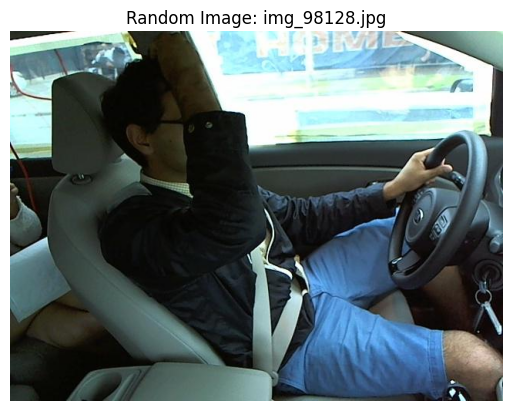

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step
Predicted Class: Drinking


In [44]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from tensorflow.keras.models import load_model

# Function to display a random image from a specified directory
def display_random_image(directory):
    # List all files in the directory
    images = os.listdir(directory)

    # Choose a random image file
    random_image = random.choice(images)

    # Construct the full path to the image
    random_image_path = os.path.join(directory, random_image)

    # Display the image
    img = Image.open(random_image_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    plt.title(f'Random Image: {random_image}')
    plt.show()

    return random_image_path

# Function to preprocess the image
def preprocess_image(image_path):
    # Load and preprocess the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    image = cv2.resize(image, (224, 224))  # Resize image to (64, 64)
    return image

# Function to predict the class of the image
def predict_image(image_path, model):
    # Preprocess the image
    preprocessed_image = preprocess_image(image_path)
    # Expand dimensions to match the model input shape
    input_image = np.expand_dims(preprocessed_image, axis=0)
    # Perform prediction
    prediction = model.predict(input_image)
    # Get the predicted class label
    predicted_class = np.argmax(prediction)
    return predicted_class

# Load the pre-trained CNN model (assuming it's saved as 'driver_dis_model.keras')
model_path = '/kaggle/working/driver_model2.keras'
driver_dis_model = load_model(model_path)

# Path to the directory containing images
image_directory = "/kaggle/input/state-farm-distracted-driver-detection/imgs/test"

# Display a random image and get its path
random_image_path = display_random_image(image_directory)

# Predict the class of the image using the model
predicted_class = predict_image(random_image_path, driver_dis_model)

# Print the predicted class label
class_labels = {
    0: 'Safe driving',
    1: 'Texting - right',
    2: 'Talking on the phone - right',
    3: 'Texting - left',
    4: 'Talking on the phone - left',
    5: 'Operating the radio',
    6: 'Drinking',
    7: 'Reaching behind',
    8: 'Hair and makeup',
    9: 'Talking to passenger'
}

print("Predicted Class:", class_labels[predicted_class])

In [45]:
 IMG_SIZE = (224 ,224) # ensures resizing each input image to 64x64 pixels
BATCH_SIZE = 40 

In [46]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_gen = ImageDataGenerator(
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.4,
    validation_split=0.2,
)

In [47]:
train_data = train_gen.flow_from_directory("/kaggle/input/state-farm-distracted-driver-detection/imgs/train",
                                           target_size=IMG_SIZE,
                                           batch_size=BATCH_SIZE,
                                           subset='training',
                                           seed=42)

Found 17943 images belonging to 10 classes.


In [48]:
val_data = train_gen.flow_from_directory("/kaggle/input/state-farm-distracted-driver-detection/imgs/train",
                                         target_size=IMG_SIZE,
                                         batch_size=BATCH_SIZE,
                                         subset='validation',
                                         seed = 42)

Found 4481 images belonging to 10 classes.


In [51]:
from tensorflow.keras.applications import EfficientNetB3
base_model = EfficientNetB3(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(10, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    train_data,
    epochs=20,
    validation_data=val_data,
    verbose=1
)

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/20
449/449 ━━━━━━━━━━━━━━━━━━━━ 369s 697ms/step - accuracy: 0.4730 - loss: 1.5131 - val_accuracy: 0.7351 - val_loss: 0.7919
Epoch 2/20
449/449 ━━━━━━━━━━━━━━━━━━━━ 265s 584ms/step - accuracy: 0.7044 - loss: 0.8500 - val_accuracy: 0.7978 - val_loss: 0.5890
Epoch 3/20
449/449 ━━━━━━━━━━━━━━━━━━━━ 263s 579ms/step - accuracy: 0.7684 - loss: 0.6784 - val_accuracy: 0.8440 - val_loss: 0.4823
Epoch 4/20
449/449 ━━━━━━━━━━━━━━━━━━━━ 262s 576ms/step - accuracy: 0.8024 - loss: 0.5863 - val_accuracy: 0.8411 - val_loss: 0.4756
Epoch 5/20
449/449 ━━━━━━━━━━━━━━━━━━━━ 267s 586ms/step - accuracy: 0.8232 - loss: 0.5224 - val_accuracy: 0.8741 - val_loss: 0.3735
Epoch 6/20
449/449 ━━━━━━━━━━━━━━━━━━━━ 282s 619ms/step - accuracy: 0.8462 - loss: 0.4546 - val_accuracy: 0.8793 - val_loss: 0.3618
Epoch 7/20
449/449 ━━━━━━━━━━━━━━━━━━━━ 267s 587ms/step - accuracy: 0.8500 - loss: 0.4453 - val_accuracy: 0.8837 - val_loss: 0.3420
Epoch 8/20
449/449 ━━━━━━

In [52]:
model.save('efficientnetb3.keras')

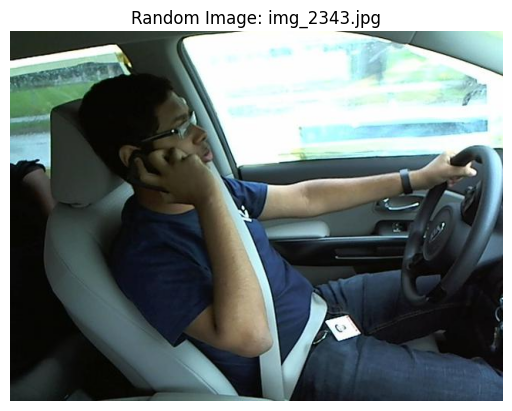

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Predicted Class: Talking on the phone - right


In [62]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from tensorflow.keras.models import load_model

# Function to display a random image from a specified directory
def display_random_image(directory):
    # List all files in the directory
    images = os.listdir(directory)

    # Choose a random image file
    random_image = random.choice(images)

    # Construct the full path to the image
    random_image_path = os.path.join(directory, random_image)

    # Display the image
    img = Image.open(random_image_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    plt.title(f'Random Image: {random_image}')
    plt.show()

    return random_image_path

# Function to preprocess the image
def preprocess_image(image_path):
    # Load and preprocess the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    image = cv2.resize(image, (224, 224))  # Resize image to (64, 64)
    return image

# Function to predict the class of the image
def predict_image(image_path, model):
    # Preprocess the image
    preprocessed_image = preprocess_image(image_path)
    # Expand dimensions to match the model input shape
    input_image = np.expand_dims(preprocessed_image, axis=0)
    # Perform prediction
    prediction = model.predict(input_image)
    # Get the predicted class label
    predicted_class = np.argmax(prediction)
    return predicted_class

# Load the pre-trained CNN model (assuming it's saved as 'driver_dis_model.keras')
model_path = '/kaggle/working/efficientnetb3.keras'
driver_dis_model = load_model(model_path)

# Path to the directory containing images
image_directory = "/kaggle/input/state-farm-distracted-driver-detection/imgs/test"

# Display a random image and get its path
random_image_path = display_random_image(image_directory)

# Predict the class of the image using the model
predicted_class = predict_image(random_image_path, driver_dis_model)

# Print the predicted class label
class_labels = {
    0: 'Safe driving',
    1: 'Texting - right',
    2: 'Talking on the phone - right',
    3: 'Texting - left',
    4: 'Talking on the phone - left',
    5: 'Operating the radio',
    6: 'Drinking',
    7: 'Reaching behind',
    8: 'Hair and makeup',
    9: 'Talking to passenger'
}

print("Predicted Class:", class_labels[predicted_class])